In [1]:
import os
import numpy as np
import pandas as pd
import xpress as xp
from xpress.enums import MIPStatus
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

os.environ['XPAUTH_PATH'] = 'License/xpauth.xpr'

In [6]:
data_path = 'Data/FICO_case_HTW2025'
data_size = '100'
cleaned = True

clean = '_cleaned' if cleaned else ''

In [7]:
df_info = pd.read_csv(f'{data_path}/data{data_size}/shares{data_size}{clean}.csv', index_col='Stock')
df_price = pd.read_csv(f'{data_path}/data{data_size}/stockprices{data_size}{clean}.csv', index_col='Stock')

df_info = df_info.loc[:, ~df_info.columns.str.contains('^Unnamed')]
df_price = df_price.loc[:, ~df_price.columns.str.contains('^Unnamed')]
df_price = df_price.astype(float)

### Delete stocks with missing ESG scores ###
missing_data_stocks = df_info[df_info.isna().any(axis=1)].index
df_info = df_info.drop(missing_data_stocks)
df_price = df_price.drop(missing_data_stocks)


df_return = np.log(df_price.T / df_price.T.shift(1)).dropna().T
df_cov = df_return.T.cov()

display(df_info)
display(df_price)
display(df_return)
display(df_cov)

,Return,Sector,ESG score
Stock,,,
Stock_1,0.1598,Healthcare,73.0
Stock_2,0.2018,Technology,95.0
Stock_3,0.0883,Consumer Goods,63.0
Stock_4,0.2048,Finance,68.0
Stock_5,0.0818,Finance,65.0
...,...,...,...
Stock_96,0.0687,Energy,63.0
Stock_97,0.1150,Energy,31.0
Stock_98,0.0552,Real Estate,59.0


,Day_1,Day_2,Day_3,Day_4,Day_5,Day_6,Day_7,Day_8,Day_9,Day_10,...,Day_4991,Day_4992,Day_4993,Day_4994,Day_4995,Day_4996,Day_4997,Day_4998,Day_4999,Day_5000
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,49.96,45.81,46.94,47.96,51.64,49.41,47.49,45.48,42.34,34.03,...,1.48,1.46,1.31,1.21,1.14,1.26,1.38,1.35,1.48,1.46
Stock_2,98.40,93.60,116.40,129.46,129.74,125.16,126.72,116.97,79.67,104.45,...,1.08,1.19,1.07,1.02,1.00,1.02,1.21,1.07,1.23,1.08
Stock_3,79.64,82.03,79.36,77.67,81.77,82.12,77.81,78.44,80.31,81.85,...,44.84,41.68,40.69,37.08,35.58,36.29,36.54,36.58,38.14,37.16
Stock_4,86.31,90.64,92.08,96.49,101.21,106.97,104.21,100.67,89.14,92.59,...,2.68,2.41,2.51,2.67,2.82,3.05,3.33,2.82,2.91,2.80
Stock_5,79.29,78.28,74.09,78.91,77.42,82.56,83.90,82.17,83.59,87.77,...,1.45,1.51,1.43,1.44,1.36,1.37,1.40,1.43,1.38,1.27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,36.39,34.96,36.94,34.91,34.12,33.59,34.88,35.20,34.74,34.05,...,6.19,6.14,5.69,5.82,5.65,5.49,5.35,5.31,5.12,5.26
Stock_97,81.50,84.20,81.07,83.77,82.77,86.21,86.86,87.82,86.09,81.38,...,448.23,442.85,433.06,442.37,458.05,438.63,433.70,430.45,452.31,458.16
Stock_98,56.10,66.20,55.67,58.12,64.19,68.54,74.41,74.87,79.43,78.29,...,1.02,1.00,1.00,1.19,1.18,1.44,1.38,1.40,1.47,1.72


,Day_2,Day_3,Day_4,Day_5,Day_6,Day_7,Day_8,Day_9,Day_10,Day_11,...,Day_4991,Day_4992,Day_4993,Day_4994,Day_4995,Day_4996,Day_4997,Day_4998,Day_4999,Day_5000
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,-0.086720,0.024368,0.021497,0.073929,-0.044144,-0.039634,-0.043246,-0.071540,-0.218490,0.069796,...,0.041385,-0.013606,-0.108409,-0.079407,-0.059592,0.100083,0.090972,-0.021979,0.091937,-0.013606
Stock_2,-0.050010,0.218002,0.106339,0.002160,-0.035940,0.012387,-0.080062,-0.384024,0.270815,0.024120,...,0.076961,0.096992,-0.106295,-0.047856,-0.019803,0.019803,0.170818,-0.122962,0.139356,-0.130053
Stock_3,0.029569,-0.033091,-0.021525,0.051441,0.004271,-0.053912,0.008064,0.023560,0.018994,-0.033923,...,-0.046196,-0.073079,-0.024039,-0.092905,-0.041294,0.019759,0.006865,0.001094,0.041762,-0.026031
Stock_4,0.048950,0.015762,0.046782,0.047758,0.055351,-0.026140,-0.034560,-0.121640,0.037973,0.076189,...,-0.109457,-0.106190,0.040656,0.061796,0.054658,0.078405,0.087831,-0.166235,0.031416,-0.038534
Stock_5,-0.012820,-0.055012,0.063027,-0.019063,0.064280,0.016100,-0.020835,0.017134,0.048796,0.003866,...,-0.006873,0.040546,-0.054435,0.006969,-0.057158,0.007326,0.021661,0.021202,-0.035591,-0.083067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,-0.040089,0.055090,-0.056522,-0.022890,-0.015655,0.037685,0.009132,-0.013154,-0.020062,0.013419,...,0.014646,-0.008110,-0.076114,0.022590,-0.029645,-0.028727,-0.025832,-0.007505,-0.036437,0.026977
Stock_97,0.032592,-0.037882,0.032762,-0.012009,0.040721,0.007511,0.010992,-0.019896,-0.056264,0.072624,...,0.029616,-0.012075,-0.022355,0.021270,0.034832,-0.043322,-0.011303,-0.007522,0.049537,0.012851
Stock_98,0.165545,-0.173239,0.043068,0.099338,0.065570,0.082173,0.006163,0.059123,-0.014456,0.037234,...,-0.038466,-0.019803,0.000000,0.173953,-0.008439,0.199129,-0.042560,0.014389,0.048790,0.157062


Stock,Stock_1,Stock_2,Stock_3,Stock_4,Stock_5,Stock_6,Stock_7,Stock_8,Stock_9,Stock_10,...,Stock_91,Stock_92,Stock_93,Stock_94,Stock_95,Stock_96,Stock_97,Stock_98,Stock_99,Stock_100
Stock,,,,,,,,,,,,,,,,,,,,,
Stock_1,0.005400,-0.000128,0.000001,0.000055,-0.000004,0.000001,0.000130,0.000036,0.000057,-0.000090,...,-0.000033,6.799668e-05,-0.000107,0.000043,-0.000034,6.684052e-05,-1.801946e-05,-0.000065,0.000008,-0.000028
Stock_2,-0.000128,0.021412,0.000086,-0.000035,0.000006,0.000080,-0.000127,-0.000019,0.000067,0.000041,...,-0.000047,9.613847e-05,-0.000168,0.000093,0.000002,3.421607e-05,2.026997e-05,0.000044,-0.000018,-0.000266
Stock_3,0.000001,0.000086,0.001312,-0.000071,-0.000025,-0.000020,0.000002,0.000005,-0.000046,0.000063,...,-0.000002,1.194005e-05,0.000015,0.000072,-0.000042,1.954779e-06,1.419561e-05,-0.000142,-0.000044,-0.000134
Stock_4,0.000055,-0.000035,-0.000071,0.005359,-0.000018,0.000070,0.000017,-0.000042,0.000079,-0.000143,...,-0.000049,-2.517565e-05,0.000013,-0.000148,0.000034,-5.150000e-06,2.219656e-05,-0.000171,0.000017,0.000002
Stock_5,-0.000004,0.000006,-0.000025,-0.000018,0.001860,0.000003,-0.000008,0.000021,-0.000055,-0.000019,...,0.000051,2.525699e-05,0.000054,0.000028,-0.000044,-3.468651e-05,-1.526359e-05,-0.000011,-0.000052,0.000085
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stock_96,0.000067,0.000034,0.000002,-0.000005,-0.000035,0.000006,0.000024,-0.000020,-0.000082,0.000023,...,0.000005,-3.822027e-07,-0.000011,0.000003,0.000015,9.794630e-04,-3.252282e-07,-0.000012,0.000006,-0.000088
Stock_97,-0.000018,0.000020,0.000014,0.000022,-0.000015,0.000023,0.000015,-0.000012,-0.000017,-0.000075,...,-0.000008,2.772384e-05,-0.000043,0.000050,0.000003,-3.252282e-07,1.567568e-03,-0.000017,-0.000002,0.000082
Stock_98,-0.000065,0.000044,-0.000142,-0.000171,-0.000011,0.000111,-0.000023,-0.000011,-0.000086,-0.000228,...,0.000141,-5.449215e-05,0.000060,-0.000116,-0.000013,-1.228700e-05,-1.710750e-05,0.014020,-0.000102,0.000104


In [8]:
ones_vec = np.ones(len(df_cov))
mu = df_info.loc[df_cov.index, 'Return'].to_numpy()
Sigma = df_cov.loc[df_cov.index, df_cov.index].to_numpy()
Sigma = 0.5 * (Sigma + Sigma.T)
Sigma_inv = np.linalg.inv(Sigma)

esg = df_info['ESG score'].astype(int).values
sectors = df_info['Sector'].tolist()
unique_sectors = sorted(set(sectors))

A = ones_vec @ Sigma_inv @ mu
B = mu.T @ Sigma_inv @ mu
C = ones_vec @ Sigma_inv @ ones_vec
D = B * C - A**2
g = (B * Sigma_inv @ ones_vec - A * Sigma_inv @ mu) / D
h = (C * Sigma_inv @ mu - A * Sigma_inv @ ones_vec) / D

w_min = Sigma_inv @ ones_vec / C
r_min = w_min @ mu

## Original Efficient Frontier

In [85]:
frontier = []

for tr in tqdm(np.linspace(mu.min(), mu.max(), 100), total=100, desc="Building frontier"):
    prob = xp.problem()
    prob.controls.outputlog = 0
    prob.controls.maxtime = 10
    w = [prob.addVariable(lb=0, ub=1, name=f'w{i}') for i in range(len(df_cov))]
    obj = xp.Sum([Sigma[i, j] * w[i] * w[j] for i in range(len(df_cov)) for j in range(len(df_cov))])
    prob.setObjective(obj, sense=xp.minimize)

    prob.addConstraint(xp.Sum(w) == 1)
    prob.addConstraint(xp.Sum([mu[i] * w[i] for i in range(len(df_cov))]) == tr)
    prob.solve()

    if prob.attributes.mipstatus in (1, 2):
        w_val = np.array([prob.getSolution(w[i]) for i in range(len(df_cov))])
        port_return = float(np.dot(mu, w_val))
        port_var = float(w_val @ Sigma @ w_val)
        port_std = np.sqrt(port_var)
        
        frontier.append({
            "target_return": tr,
            "achieved_return": port_return,
            "variance": port_var,
            "stdev": port_std,
            "weights": w_val
        })

frontier_df = pd.DataFrame(frontier)

Building frontier: 100%|██████████| 100/100 [00:05<00:00, 18.30it/s]


In [86]:
m = np.linspace(mu.min(), mu.max(), 100)
Sigma_m = np.sqrt(C/D * (m - A/C) ** 2 + 1/C)
asset_returns = mu.copy()
asset_stdevs  = df_return.std(axis=1)


num_port = 100000
alpha = 0.0005
weights = np.random.dirichlet(np.full(len(mu), alpha), num_port)

port_returns = weights @ mu
port_stdevs = np.sqrt(np.einsum('ij,jk,ik->i', weights, Sigma, weights))
port_df_1 = pd.DataFrame({'Volatility': port_stdevs, 'Return': port_returns})



num_port = 5000
n_bins = len(frontier_df)
n_per_bin = num_port // n_bins
kappa_min = 1
kappa_max = 100000.0
n_kappa_levels = 20

W_front = np.vstack(frontier_df["weights"].to_numpy())
eps = 1e-9

kappa_vals = np.geomspace(kappa_min, kappa_max, n_kappa_levels)
beta = 1
kappa_wts = 1.0 / (kappa_vals ** beta + 1e-12)
kappa_wts = kappa_wts / kappa_wts.sum()

weights_list = []
for i in tqdm(range(n_bins), total=n_bins, desc="Stratified sampling along frontier (kappa sweep)"):
    sizes = np.floor(n_per_bin * kappa_wts).astype(int)
    leftover = n_per_bin - sizes.sum()
    if leftover > 0:
        sizes[:leftover] += 1

    for kappa, sz in zip(kappa_vals, sizes):
        if sz > 0:
            alphas_i = kappa * (W_front[i] + eps)
            weights_list.append(np.random.dirichlet(alphas_i, sz))

weights = np.vstack(weights_list)

rem = num_port - weights.shape[0]
if rem > 0:
    idx_bins_extra = np.linspace(0, n_bins - 1, rem).round().astype(int)
    idx_kappa_extra = np.random.choice(len(kappa_vals), size=rem, p=kappa_wts)
    extra = [np.random.dirichlet(kappa_vals[k] * (W_front[b] + eps), 1) for b, k in zip(idx_bins_extra, idx_kappa_extra)]
    weights = np.vstack([weights] + extra)


port_returns = weights @ mu
port_stdevs = np.sqrt(np.einsum('ij,jk,ik->i', weights, Sigma, weights))
port_df_2 = pd.DataFrame({'Volatility': port_stdevs, 'Return': port_returns})

port_df = pd.concat([port_df_1, port_df_2], ignore_index=True)

Stratified sampling along frontier (kappa sweep): 100%|██████████| 100/100 [00:00<00:00, 9235.10it/s]


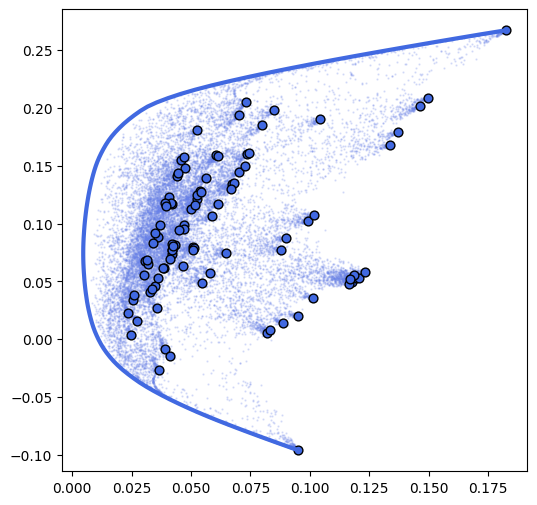

In [89]:
plt.figure(figsize=(6, 6))
# plt.plot(Sigma_m, m, color='k', linestyle='--', linewidth=2)
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3)
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2)
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40)
# plt.tight_layout()
plt.savefig(f'Results/Portfolio_Frontier{clean}.png', dpi=144, transparent=True)
plt.show()

## MIQP (Mixed-Integer Quadratic Programming Portfolio Optimization)
https://www.fico.com/fico-xpress-optimization/docs/latest/getting_started/dhtml/chap7_sec_c7s3.html

In [90]:
esg_min = 70.0
target_return = 0.05
max_w_per_asset = 0.20
min_w_if_selected = 0.01
max_w_per_sector = 0.25
min_n_assets = 50

In [ ]:
esg_min = 70.0
target_return = 0.05
max_w_per_asset = 0.20
min_w_if_selected = 0.01
max_w_per_sector = 0.25
min_n_assets = 50

frontier_esg = []

for tr in tqdm(np.linspace(0, mu.max(), 100), total=100, desc="Building ESG frontier"):
    prob = xp.problem()
    prob.controls.outputlog = 0
    prob.controls.maxtime = 10
    w = [prob.addVariable(lb=0, ub=1, name=f'w{i}') for i in range(len(df_cov))]
    y = [prob.addVariable(vartype=xp.binary, name=f'y{i}') for i in range(len(df_cov))]
    quad = xp.Sum(Sigma[i, j] * w[i] * w[j] for i in range(len(df_cov)) for j in range(len(df_cov)))
    prob.setObjective(quad, sense=xp.minimize)

    prob.addConstraint(xp.Sum(w) == 1)
    prob.addConstraint(xp.Sum([mu[i] * w[i] for i in range(len(df_cov))]) >= tr)
    prob.addConstraint(xp.Sum([esg[i] * w[i] for i in range(len(df_cov))]) >= float(esg_min))

    for i in range(len(df_cov)):
        prob.addConstraint(w[i] <= max_w_per_asset * y[i])
        prob.addConstraint(w[i] >= min_w_if_selected * y[i])

    for sec in unique_sectors:
        idx = [i for i, sct in enumerate(sectors) if sct == sec]
        if idx:
            prob.addConstraint(xp.Sum(w[i] for i in idx) <= max_w_per_sector)

    prob.addConstraint(xp.Sum(y) >= int(min_n_assets))

    prob.optimize()

    if prob.attributes.mipstatus in (MIPStatus.OPTIMAL, MIPStatus.SOLUTION):
        w_val = np.array([prob.getSolution(w[i]) for i in range(len(df_cov))])
        port_return = float(np.dot(mu, w_val))
        port_var = float(w_val @ Sigma @ w_val)
        port_std = np.sqrt(port_var)
        
        frontier_esg.append({
            "target_return": tr,
            "achieved_return": port_return,
            "variance": port_var,
            "stdev": port_std,
            "weights": w_val
        })

frontier_esg_df = pd.DataFrame(frontier_esg)

Building ESG frontier: 100%|██████████| 100/100 [04:48<00:00,  2.88s/it]


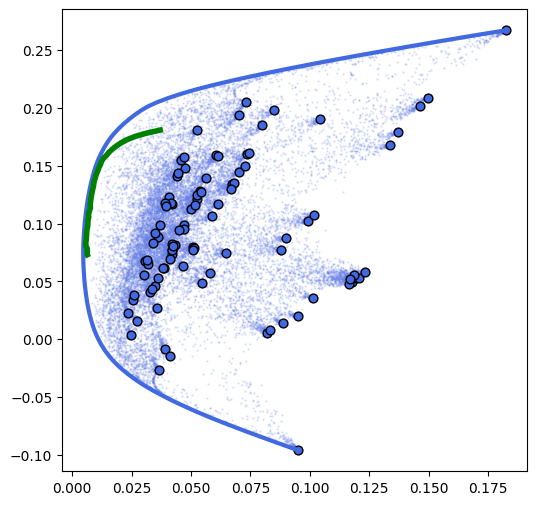

In [92]:
plt.figure(figsize=(6, 6))
# plt.plot(Sigma_m, m, color='k', linestyle='--', linewidth=2)
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3)
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4)
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2)
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40)
# plt.tight_layout()
plt.savefig(f'Results/Portfolio_Frontier_ESG{clean}.png', dpi=144, transparent=True)
plt.show()

## Brown Portfolio

In [21]:
esg_max = 60.0

In [22]:
frontier_brown = []
for tr in tqdm(np.linspace(0, mu.max(), 100), total=100, desc="Building Brown frontier"):
    prob = xp.problem()
    prob.controls.outputlog = 0
    prob.controls.maxtime = 10
    w = [prob.addVariable(lb=0, ub=1, name=f'w{i}') for i in range(len(df_cov))]
    y = [prob.addVariable(vartype=xp.binary, name=f'y{i}') for i in range(len(df_cov))]
    quad = xp.Sum(Sigma[i, j] * w[i] * w[j] for i in range(len(df_cov)) for j in range(len(df_cov)))
    prob.setObjective(quad, sense=xp.minimize)

    prob.addConstraint(xp.Sum(w) == 1)
    prob.addConstraint(xp.Sum([mu[i] * w[i] for i in range(len(df_cov))]) >= tr)
    prob.addConstraint(xp.Sum([esg[i] * w[i] for i in range(len(df_cov))]) <= float(esg_max))

    for i in range(len(df_cov)):
        prob.addConstraint(w[i] <= max_w_per_asset * y[i])
        prob.addConstraint(w[i] >= min_w_if_selected * y[i])

    for sec in unique_sectors:
        idx = [i for i, sct in enumerate(sectors) if sct == sec]
        if idx:
            prob.addConstraint(xp.Sum(w[i] for i in idx) <= max_w_per_sector)

    prob.addConstraint(xp.Sum(y) >= int(min_n_assets))

    prob.optimize()

    if prob.attributes.mipstatus in (MIPStatus.OPTIMAL, MIPStatus.SOLUTION):
        w_val = np.array([prob.getSolution(w[i]) for i in range(len(df_cov))])
        port_return = float(np.dot(mu, w_val))
        port_var = float(w_val @ Sigma @ w_val)
        port_std = np.sqrt(port_var)
        
        frontier_brown.append({
            "target_return": tr,
            "achieved_return": port_return,
            "variance": port_var,
            "stdev": port_std,
            "weights": w_val
        })

frontier_nesg_df = pd.DataFrame(frontier_brown)

Building Brown frontier: 100%|██████████| 100/100 [00:58<00:00,  1.71it/s]


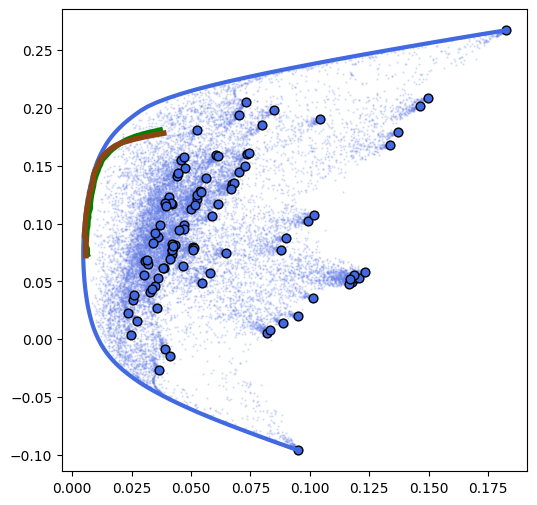

In [93]:
plt.figure(figsize=(6, 6))
# plt.plot(Sigma_m, m, color='k', linestyle='--', linewidth=2)
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3)
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.plot(frontier_nesg_df["stdev"], frontier_nesg_df["achieved_return"], color='saddlebrown', linewidth=4, label="Brown Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2)
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40)
# plt.tight_layout()
plt.savefig(f'Results/Portfolio_Frontier_ESG_Brown{clean}.png', dpi=144, transparent=True)
plt.show()


In [24]:
frontier_esg_df = frontier_esg_df.sort_values(by="achieved_return", ascending=True).reset_index(drop=True)
frontier_nesg_df = frontier_nesg_df.sort_values(by="achieved_return", ascending=True).reset_index(drop=True)

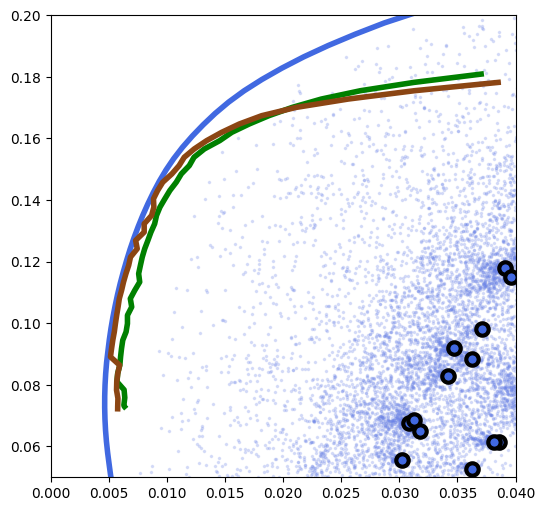

In [94]:
plt.figure(figsize=(6, 6))
# plt.plot(Sigma_m, m, color='k', linestyle='--', linewidth=4)
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=4)
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.plot(frontier_nesg_df["stdev"], frontier_nesg_df["achieved_return"], color='saddlebrown', linewidth=4, label="Brown Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=2.5, c='#6881E7', alpha=0.2)
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=3, s=80)
plt.xlim(0, 0.04)
plt.ylim(0.05, 0.2)
# plt.tight_layout()
plt.savefig(f'Results/Portfolio_Frontier_ESG_Brown_Zoom{clean}.png', dpi=144, transparent=True)
plt.show()

## Benchmark

In [54]:
EW = pd.read_csv(f'Results/Benchmark Portfolios/Equal_Weights.csv')
IVW = pd.read_csv(f'Results/Benchmark Portfolios/Inverse_Volatility_Weights.csv')

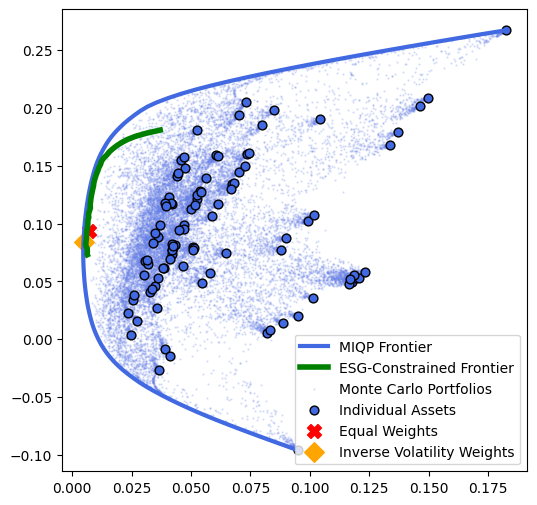

In [95]:
w_ew = EW['0'].to_numpy()
ret_ew = float(mu @ w_ew)
vol_ew = float(np.sqrt(w_ew @ Sigma @ w_ew))

w_ivw = IVW['0'].to_numpy()
ret_ivw = float(mu @ w_ivw)
vol_ivw = float(np.sqrt(w_ivw @ Sigma @ w_ivw))

plt.figure(figsize=(6, 6))



# plt.plot(Sigma_m, m, color='k', linestyle='--', linewidth=2, label='Analytical Frontier')
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label='MIQP Frontier')
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label='ESG-Constrained Frontier')

plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label='Monte Carlo Portfolios')
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label='Individual Assets')

plt.scatter(vol_ew, ret_ew, c='red', marker='X', s=100, label='Equal Weights')
plt.scatter(vol_ivw, ret_ivw, c='orange', marker='D', s=100, label='Inverse Volatility Weights')

plt.legend(loc='best')

# plt.tight_layout()
plt.savefig(f'Results/ESG Frontier vs Benchmarks{clean}.png', transparent=True, dpi=144)
plt.show()

## Output

In [59]:
def parse_weights(s):
    if isinstance(s, str):
        return np.array(s.strip("[]").split(), dtype=float)
    elif isinstance(s, (list, np.ndarray)):
        return np.array(s, dtype=float)
    else:
        raise ValueError(f"Unexpected type: {type(s)}")

def expand_frontier(df_in, asset_cols, out_path):
    wmat = np.vstack(df_in["weights"].apply(parse_weights).to_numpy())
    # Fallback if dimension mismatch
    if len(asset_cols) != wmat.shape[1]:
        asset_cols = [f"asset_{i}" for i in range(wmat.shape[1])]
    wdf = pd.DataFrame(wmat, columns=asset_cols)
    df_out = pd.concat([df_in.drop(columns=["weights"]), wdf], axis=1)
    df_out.to_csv(out_path, index=False)
    return df_out

# Prefer the covariance index ordering (matches optimization variable order)
asset_cols = df_cov.index.tolist()

# Apply to the three frontiers
frontier_expanded       = expand_frontier(frontier_df,        asset_cols, f"Results/frontier_expanded{clean}.csv")
frontier_esg_expanded   = expand_frontier(frontier_esg_df,    asset_cols, f"Results/frontier_esg_expanded{clean}.csv")
frontier_nesg_expanded  = expand_frontier(frontier_nesg_df,   asset_cols, f"Results/frontier_nesg_expanded{clean}.csv")

In [60]:
frontier_expanded.to_csv(f'Results/frontier_df{clean}.csv')
frontier_esg_expanded.to_csv(f'Results/frontier_esg_df{clean}.csv')
frontier_nesg_expanded.to_csv(f'Results/frontier_nesg_df{clean}.csv')

## Tangency Portfolio

In [113]:
# === Tangency Portfolio (Sharpe ratio max) ===
rf = 0.0

# Original Frontier
frontier_df["sharpe"] = (frontier_df["achieved_return"] - rf) / frontier_df["stdev"]
idx_tan = frontier_df["sharpe"].idxmax()
tan_ret = float(frontier_df.loc[idx_tan, "achieved_return"])
tan_vol = float(frontier_df.loc[idx_tan, "stdev"])
tan_w   = np.array(frontier_df.loc[idx_tan, "weights"])

# Green Frontier
frontier_esg_df["sharpe"] = (frontier_esg_df["achieved_return"] - rf) / frontier_esg_df["stdev"]
idx_tan_esg = frontier_esg_df["sharpe"].idxmax()
tan_ret_esg = float(frontier_esg_df.loc[idx_tan_esg, "achieved_return"])
tan_vol_esg = float(frontier_esg_df.loc[idx_tan_esg, "stdev"])
tan_w_esg   = np.array(frontier_esg_df.loc[idx_tan_esg, "weights"])

# Brown Frontier
frontier_nesg_df["sharpe"] = (frontier_nesg_df["achieved_return"] - rf) / frontier_nesg_df["stdev"]
idx_tan_b = frontier_nesg_df["sharpe"].idxmax()
tan_ret_b = float(frontier_nesg_df.loc[idx_tan_b, "achieved_return"])
tan_vol_b = float(frontier_nesg_df.loc[idx_tan_b, "stdev"])
tan_w_b   = np.array(frontier_nesg_df.loc[idx_tan_b, "weights"])

# === Output CSV ===
os.makedirs('Results/Tangency', exist_ok=True)

pd.DataFrame({"asset": df_cov.index.tolist(), "weight": tan_w}).to_csv(
    f"Results/Tangency/tangency_original_weights{clean}.csv", index=False)
pd.DataFrame({"asset": df_cov.index.tolist(), "weight": tan_w_esg}).to_csv(
    f"Results/Tangency/tangency_green_weights{clean}.csv", index=False)
pd.DataFrame({"asset": df_cov.index.tolist(), "weight": tan_w_b}).to_csv(
    f"Results/Tangency/tangency_brown_weights{clean}.csv", index=False)

pd.DataFrame([{"frontier":"original","rf":rf,"return":tan_ret,"vol":tan_vol,
               "sharpe":(tan_ret-rf)/tan_vol}]).to_csv(
    f"Results/Tangency/tangency_original_summary{clean}.csv", index=False)
pd.DataFrame([{"frontier":"green","rf":rf,"return":tan_ret_esg,"vol":tan_vol_esg,
               "sharpe":(tan_ret_esg-rf)/tan_vol_esg}]).to_csv(
    f"Results/Tangency/tangency_green_summary{clean}.csv", index=False)
pd.DataFrame([{"frontier":"brown","rf":rf,"return":tan_ret_b,"vol":tan_vol_b,
               "sharpe":(tan_ret_b-rf)/tan_vol_b}]).to_csv(
    f"Results/Tangency/tangency_brown_summary{clean}.csv", index=False)

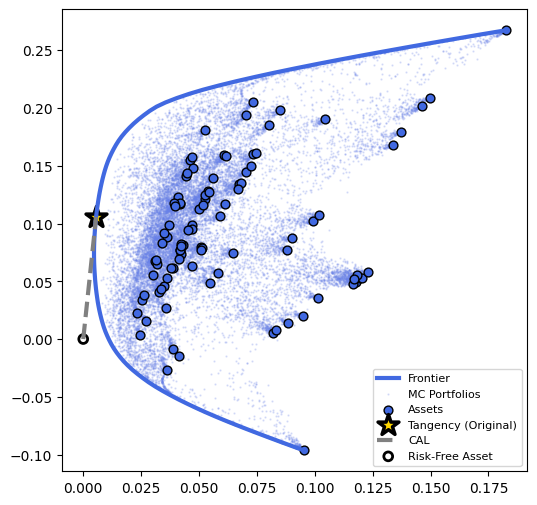

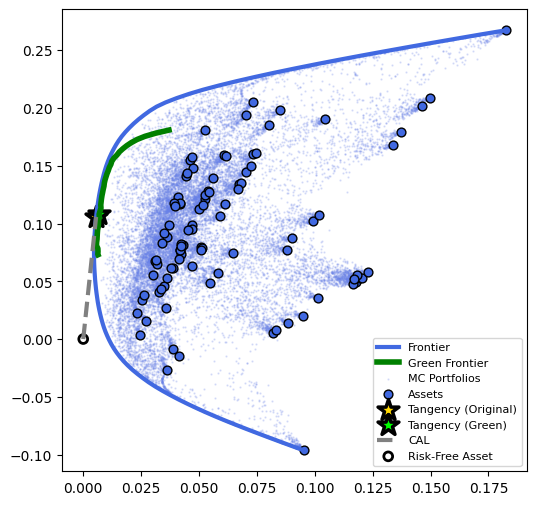

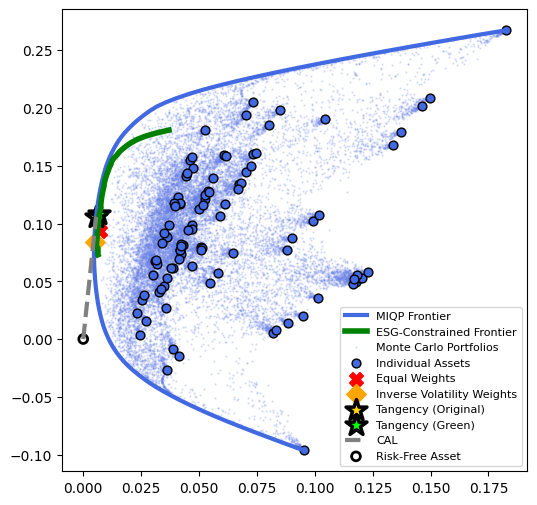

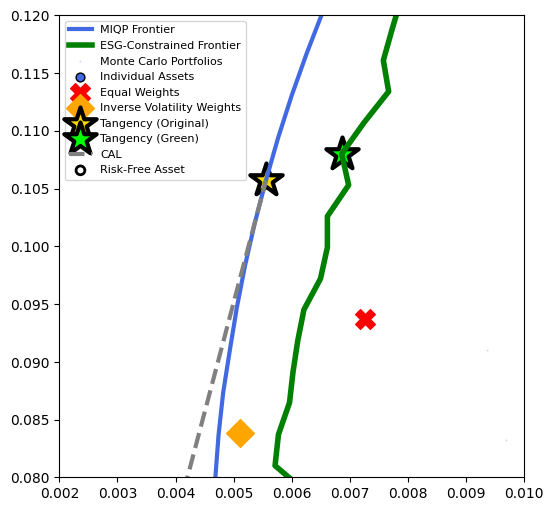

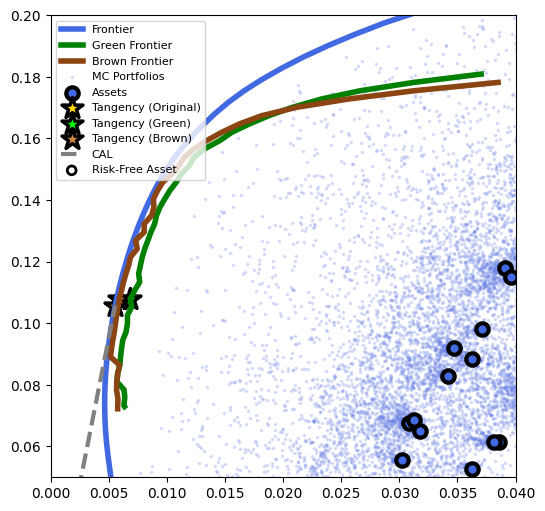

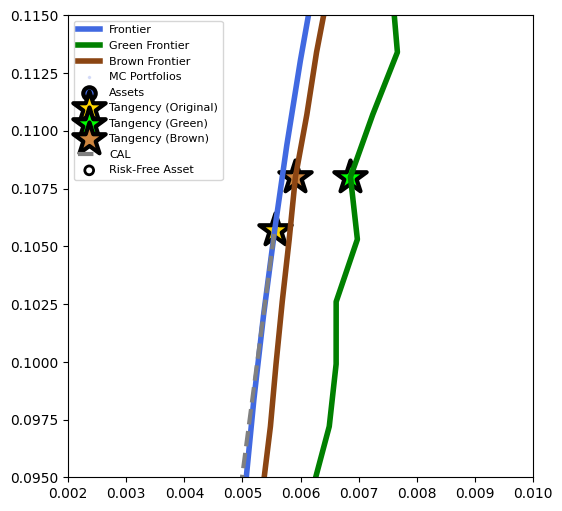

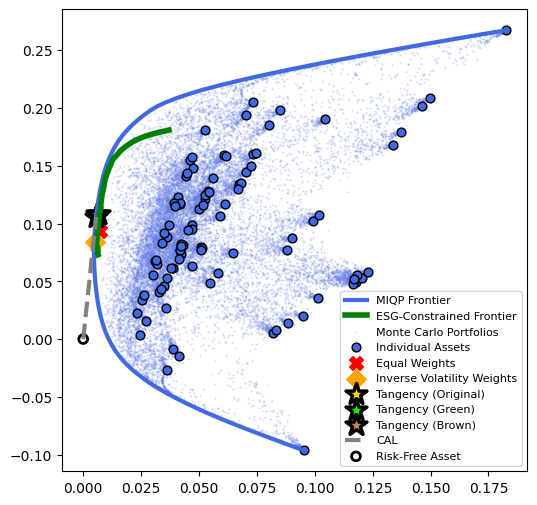

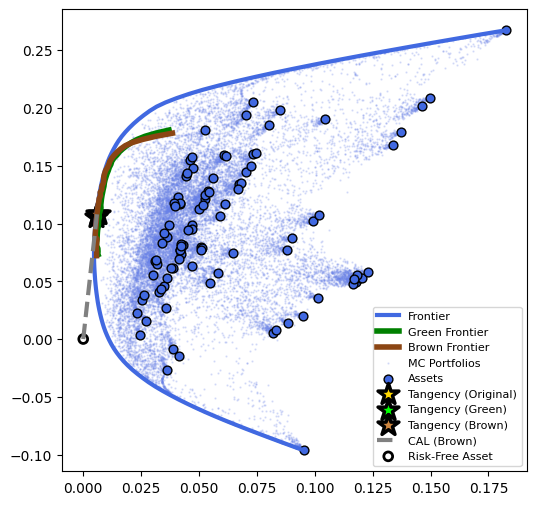

In [140]:
plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label="Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label="MC Portfolios")
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label="Assets")

# Tangency (Original)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
# CAL + rf
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/Portfolio_Frontier{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label="Frontier")
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label="MC Portfolios")
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label="Assets")

# Tangency (Original & Green)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Green)')
# CAL + rf (Green)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/Portfolio_Frontier_ESG{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label='MIQP Frontier')
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label='ESG-Constrained Frontier')
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label='Monte Carlo Portfolios')
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label='Individual Assets')

plt.scatter(vol_ew, ret_ew, c='red', marker='X', s=100, label='Equal Weights')
plt.scatter(vol_ivw, ret_ivw, c='orange', marker='D', s=100, label='Inverse Volatility Weights')

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Green)')
# CAL + rf (Original)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/ESG_Frontier_vs_Benchmarks{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label='MIQP Frontier')
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label='ESG-Constrained Frontier')
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label='Monte Carlo Portfolios')
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label='Individual Assets')

plt.scatter(vol_ew, ret_ew, c='red', marker='X', s=200, label='Equal Weights')
plt.scatter(vol_ivw, ret_ivw, c='orange', marker='D', s=200, label='Inverse Volatility Weights')

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=600, linewidths=3, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=600, linewidths=3, label='Tangency (Green)')
# CAL + rf (Original)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.xlim(0.002, 0.01)
plt.ylim(0.08, 0.12)
plt.savefig(f'Results/ESG_Frontier_vs_Benchmarks_Zoom{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=4, label="Frontier")
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.plot(frontier_nesg_df["stdev"], frontier_nesg_df["achieved_return"], color='saddlebrown', linewidth=4, label="Brown Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=2.5, c='#6881E7', alpha=0.2, label="MC Portfolios")
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=3, s=80, label="Assets")

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Green)')
plt.scatter(tan_vol_b, tan_ret_b, c='peru', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Brown)')
# CAL + rf (Brown)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.xlim(0, 0.04)
plt.ylim(0.05, 0.2)
plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/Portfolio_Frontier_ESG_Brown_Zoom{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=4, label="Frontier")
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.plot(frontier_nesg_df["stdev"], frontier_nesg_df["achieved_return"], color='saddlebrown', linewidth=4, label="Brown Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=2.5, c='#6881E7', alpha=0.2, label="MC Portfolios")
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=3, s=80, label="Assets")

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=600, linewidths=3, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=600, linewidths=3, label='Tangency (Green)')
plt.scatter(tan_vol_b, tan_ret_b, c='peru', edgecolors='k', marker='*', s=600, linewidths=3, label='Tangency (Brown)')
# CAL + rf (Brown)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.xlim(0.002, 0.01)
plt.ylim(0.095, 0.115)
plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/Portfolio_Frontier_ESG_Brown_Zoom_Close{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label='MIQP Frontier')
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label='ESG-Constrained Frontier')
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label='Monte Carlo Portfolios')
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label='Individual Assets')

plt.scatter(vol_ew, ret_ew, c='red', marker='X', s=100, label='Equal Weights')
plt.scatter(vol_ivw, ret_ivw, c='orange', marker='D', s=100, label='Inverse Volatility Weights')

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Green)')
plt.scatter(tan_vol_b, tan_ret_b, c='peru', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Brown)')
# CAL + rf (Original)
plt.plot([0, tan_vol], [rf, tan_ret], linestyle='--', color='gray', linewidth=3, label='CAL')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/ESG_Frontier_vs_Benchmarks_All{clean}.png', dpi=144, transparent=True)
plt.show()


plt.figure(figsize=(6, 6))
plt.plot(frontier_df["stdev"], frontier_df["achieved_return"], color='royalblue', linewidth=3, label="Frontier")
plt.plot(frontier_esg_df["stdev"], frontier_esg_df["achieved_return"], color='green', linewidth=4, label="Green Frontier")
plt.plot(frontier_nesg_df["stdev"], frontier_nesg_df["achieved_return"], color='saddlebrown', linewidth=4, label="Brown Frontier")
plt.scatter(port_df['Volatility'], port_df['Return'], s=0.5, c='#6881E7', alpha=0.2, label="MC Portfolios")
plt.scatter(asset_stdevs, asset_returns, facecolors='royalblue', edgecolors='k', linewidths=1, s=40, label="Assets")

# Tangency (Original / Green / Brown)
plt.scatter(tan_vol, tan_ret, c='gold', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Original)')
plt.scatter(tan_vol_esg, tan_ret_esg, c='lime', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Green)')
plt.scatter(tan_vol_b, tan_ret_b, c='peru', edgecolors='k', marker='*', s=250, linewidths=2.5, label='Tangency (Brown)')
# CAL + rf
plt.plot([0, tan_vol_b], [rf, tan_ret_b], linestyle='--', color='gray', linewidth=3, label='CAL (Brown)')
plt.scatter(0, rf, facecolors='none', edgecolors='k', s=40, linewidths=2, label='Risk-Free Asset')

plt.legend(loc='best', fontsize=8)
plt.savefig(f'Results/Portfolio_Frontier_ESG_Brown{clean}.png', dpi=144, transparent=True)
plt.show()



## ??Should we add Utility functions??